**Кратий план работы:**

**Исследовательский анализ стартапа, продающего продукты питания:**

1. Открыть файл и посмотреть информацию, изучить общую информацию о датасете:
   - посмотреть наличие пропусков и дубликатов, зафиксировать начальные данные.
2. Выполнить предобработку данных:
   - заменить названия и преобразовать типы столбцов
   - обработать пропуски
   - добавить столбец с названием улиц и столбец с с адресом.
3. Проанализировать данные:
   - Исследовать количество объектов общественного питания
   - Изучить количество посадочных мест по категориям
   - Рассмотреть соотношение сетевых и несетевых заведений
   - Найти топ-15 популярных сетей в Москве
   - Проанализировать административные районы Москвы
   - Визуализировать распределение средних рейтингов по категориям
   - Построить фоновую картограмму со средним рейтингом заведений
   - Отобразить все завдения дасета с помощью кластеров
   - Отобразить топ-15 улиц по количеству заведений
   - Найти улицы с одним объектом общепита
   - Расчитать медиану средних чеков
   - Проанализировать заведения с плохим рейтингом
4. Провести исследование для открытия кофейни
5. Подготовить презентаю исследования для инвесторов
6. Написать промежуточные и общий вывод.
7. **Цель исследования:** Подготовить исследование рынка Москвы и найти интересные особенности, которые помогут выбрать подходящее место для кофейни

# Шаг №1 Изучение общей информации

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import json
from plotly.offline import iplot
import cufflinks
cufflinks.go_offline()

In [2]:
#open file
try:
    moscow_places = pd.read_csv('/datasets/moscow_places.csv')
except:
    url = 'https://drive.google.com/file/d/1jeLikcF8EFImssUN_TM4grxmp1c-ghLz/view?usp=drive_link'
    path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
    moscow_places = pd.read_csv(path)

In [3]:
# Функция для просмотра информации о DataFrame
def info_data_frame (x):
    return  display(
        print('------Информация о DataFrame------\n'),
        x.info(),
        '-'* 25,           
        'Вывод первых 5 строчек:', x.head(),           
        f'Число строк : {x.shape[0]}',
        '-'* 25,
        f'Число столбцов : {x.shape[1]}',
        '-'* 25,
        f'Количество дубликатов = {x.duplicated().sum()}',
        '-'* 25,
        'Пропущенные значения:',  x.isna().sum(),
        '-'* 25,            
        'Процент пропусков от всего DataFrame:',
         (x.isna().mean().sort_values(ascending=False)*100).round(2).astype(str) + '%'
        )   

In [4]:
info_data_frame(moscow_places)

------Информация о DataFrame------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

None

'-------------------------'

'Вывод первых 5 строчек:'

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


'Число строк : 8406'

'-------------------------'

'Число столбцов : 14'

'-------------------------'

'Количество дубликатов = 0'

'-------------------------'

'Пропущенные значения:'

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

'-------------------------'

'Процент пропусков от всего DataFrame:'

middle_coffee_cup    93.64%
middle_avg_bill      62.54%
price                60.56%
avg_bill              54.6%
seats                42.96%
hours                 6.38%
name                   0.0%
category               0.0%
address                0.0%
district               0.0%
lat                    0.0%
lng                    0.0%
rating                 0.0%
chain                  0.0%
dtype: object

In [5]:
#переведем в нижний регистр все значения для удобства
moscow_places['name'] = moscow_places['name'].str.lower()
moscow_places['address'] = moscow_places['address'].str.lower()
moscow_places['avg_bill'] = moscow_places['avg_bill'].str.lower()
moscow_places['name'].columns =  moscow_places['name'].replace('ё', 'е')

In [6]:
#Проверка на неявные дубликаты
moscow_places.duplicated(subset=['name', 'address']).sum()

4

In [7]:
#Удаление неявных дубликатов
moscow_places  = moscow_places.drop_duplicates(subset=['name', 'address'])

In [8]:
#Проверка на неявные дубликаты
moscow_places.duplicated(subset=['name', 'address']).sum()

0

In [9]:
display(f"Всего заведений: {moscow_places['name'].nunique()}")

'Всего заведений: 5512'

In [10]:
moscow_places['category'].value_counts()

кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">   

**Вывод по разделу:** 

**1.** Открыт DataFrame **`moscow_places`** - всего 14 столбцов и 8406 строк, явные дубликаты отсутствуют, не явные удалены, обнаружены пропуски в столбцах, так как их большое количество удалять их не стоит, так как будет искажение в данных: 
- `hours` - 536 - индивидуально для каждого заведения
- `price` - 5091 - для кажого административного округа может быть разным,
- `avg_bill` - 4590 - значения распределены между столбцами `middle_avg_bill` и `middle_coffee_cup`, решение оставить как есть,
- `middle_avg_bill` - 5257,
- `middle_coffee_cup` - 7871,
- `seats` - 3611 - - индивидуально для каждого заведения
  
**2.** Переименование столбцов и приведение к нижнему регистру не нужно, типы столбцов соотвествуют

**3.** Всего заведений - 5614
</div>

# Шаг 2. Предобработка данных

In [11]:
#отберем значение между запяттыми методом split()
moscow_places['street'] = moscow_places['address'].str.split(',').str[1]

In [12]:
moscow_places['street'].head(15)

0                улица дыбенко
1                улица дыбенко
2           клязьминская улица
3      улица маршала федоренко
4          правобережная улица
5               ижорская улица
6           клязьминская улица
7           клязьминская улица
8            дмитровское шоссе
9              ангарская улица
10          левобережная улица
11     улица маршала федоренко
12                        мкад
13             базовская улица
14             ангарская улица
Name: street, dtype: object

In [13]:
#Создание столбца с булевым значением
moscow_places['is_24_7'] = moscow_places['hours'].isin(['ежедневно, круглосуточно'])

In [14]:
#Проверка
moscow_places['is_24_7'].tail()

8401    False
8402    False
8403     True
8404     True
8405     True
Name: is_24_7, dtype: bool

In [15]:
moscow_places.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
 14  street             8402 non-null   object 
 15  is_24_7            8402 non-null   bool   
dtypes: bool(1), float64(6), 

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">   

**Вывод по разделу:** 

**1.** Созданы 2 столбца: `street` - с наименованиями улиц и `is_24_7` - с булевыми значениями, True - если заведение работает круглосуточно, пропуски оставлены.
</div>

# Шаг 3. Анализ данных

## Исследования количества заведений по  категориям

In [16]:
moscow_places_category = moscow_places.pivot_table(index = 'category', values = 'name', aggfunc = 'count') \
    .sort_values(by='name', ascending=False).reset_index()

In [17]:
moscow_places_category['ratio'] = ((moscow_places_category['name'] / moscow_places_category['name'].sum()) * 100) \
    .round(0).astype(str) + '%'

In [18]:
moscow_places_category

,category,name,ratio
0,кафе,2376,28.0%
1,ресторан,2042,24.0%
2,кофейня,1413,17.0%
3,"бар,паб",764,9.0%
4,пиццерия,633,8.0%
5,быстрое питание,603,7.0%
6,столовая,315,4.0%
7,булочная,256,3.0%


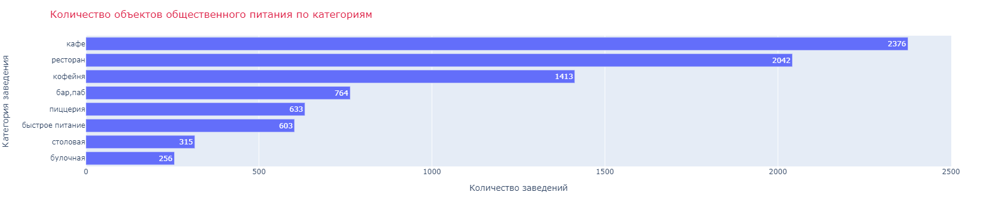

In [19]:
# строим столбчатую диаграмму 
fig = px.bar(moscow_places_category.sort_values(by='name', ascending=True), # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='name'
            )
# оформляем график
fig.update_layout(title='Количество объектов общественного питания по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория заведения', 
                  title_font_color="#DC143C")

fig.show() # выводим график

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">       
Большое преимущество среди объектов питания города Москвы имеет категория `кафе` - 2378, далее идут `рестораны` в количестве 2043, меньше всего `булочных` - 246. 
</div>

## Исследование количества посадочных мест по категориям

In [20]:
#Среднее количество мест по категориям
moscow_places_category_seats_mean = moscow_places.pivot_table(index = 'category', values = 'seats', aggfunc = 'mean') \
    .sort_values(by='seats', ascending=False).round(0).reset_index()

In [21]:
moscow_places_category_seats_mean.T

,0,1,2,3,4,5,6,7
category,"бар,паб",ресторан,кофейня,столовая,быстрое питание,кафе,пиццерия,булочная
seats,124.0,122.0,111.0,100.0,99.0,97.0,94.0,89.0


In [22]:
#Медианное значение количества мест по категориям
moscow_places_category_seats_median = moscow_places.pivot_table(index = 'category', values = 'seats', aggfunc = 'median') \
    .sort_values(by='seats', ascending=False).round(0).reset_index()

In [23]:
moscow_places_category_seats_median['seats'] = moscow_places_category_seats_median['seats'].astype(int)

In [24]:
moscow_places_category_seats_median['ratio'] = ((moscow_places_category_seats_median['seats'] / moscow_places_category_seats_median['seats'].sum()) * 100) \
    .round(0).astype(str) + '%'

In [25]:
moscow_places_category_seats_median.T

,0,1,2,3,4,5,6,7
category,ресторан,"бар,паб",кофейня,столовая,быстрое питание,кафе,пиццерия,булочная
seats,86,82,80,76,65,60,55,50
ratio,16.0%,15.0%,14.0%,14.0%,12.0%,11.0%,10.0%,9.0%


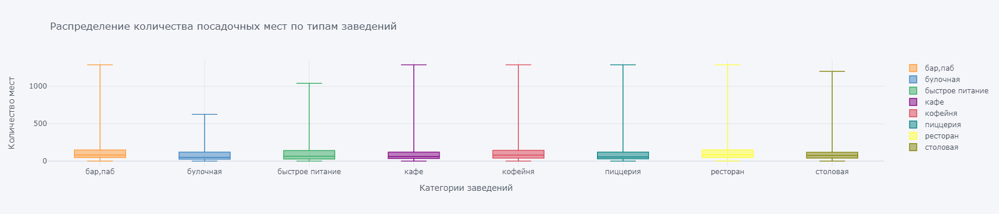

In [26]:
moscow_places.pivot(columns='category', values='seats').iplot(
        kind='box',
        yTitle='Количество мест',
        xTitle='Категории заведений',
        title='Распределение количества посадочных мест по типам заведений'
        )

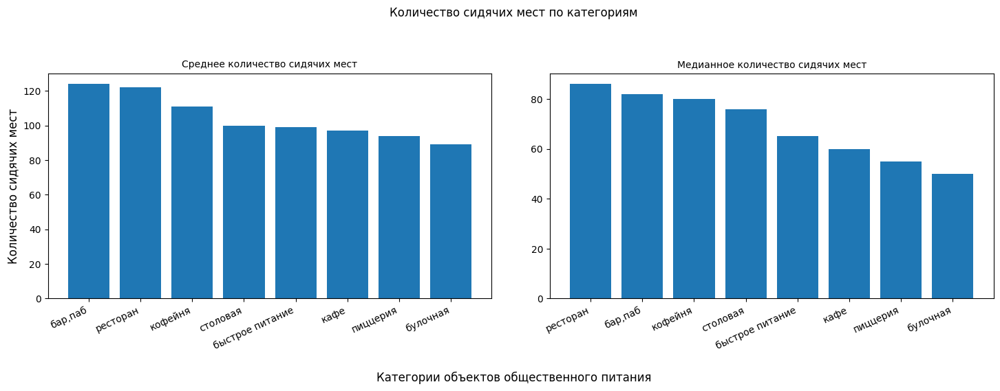

In [28]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

#Общее название
fig.suptitle('Количество сидячих мест по категориям', fontsize=12) #Титульное название
fig.tight_layout(pad=3.0) #Отступ от титульного названия

ax0.bar('category', 'seats', data = moscow_places_category_seats_mean)
ax0.set_title('Среднее количество сидячих мест', fontsize=10) #Название

ax0.set_ylabel('Количество сидячих мест', fontsize=12)
ax1.bar('category', 'seats', data = moscow_places_category_seats_median)
ax1.set_title('Медианное количество сидячих мест', fontsize=10)

#Поворачиваем нижние надписи левого графика
plt.setp(ax0.get_xticklabels(), rotation=25, ha="right")
#Поворачиваем нижние надписи правого графика
plt.setp(ax1.get_xticklabels(), rotation=25, ha="right")

fig.text(0.5, -.100191, 'Категории объектов общественного питания', ha='center', va='center', fontsize=12)
plt.show()

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">       
Как видно из данного графика все категории имеют выбросы, наибольшее количество сидячих мест имеют рестораны - 86 и  бары - 82, меньше всего пиццерия - 55 и булочная - 50
</div>

## Соотношение сетевых и не сетевых заведений

In [29]:
#Соотношение сетевых и не сетевых заведений
moscow_places_chain = moscow_places.pivot_table(index = 'chain', values = 'name', aggfunc = 'count') \
    .sort_values(by = 'name', ascending = False).reset_index()

In [30]:
moscow_places_chain['chain'] = moscow_places_chain['chain'].replace(0, 'Не сетевое заведение')
moscow_places_chain['chain'] = moscow_places_chain['chain'].replace(1, 'Cетевое заведение')

In [31]:
moscow_places_chain

,chain,name
0,Не сетевое заведение,5199
1,Cетевое заведение,3203


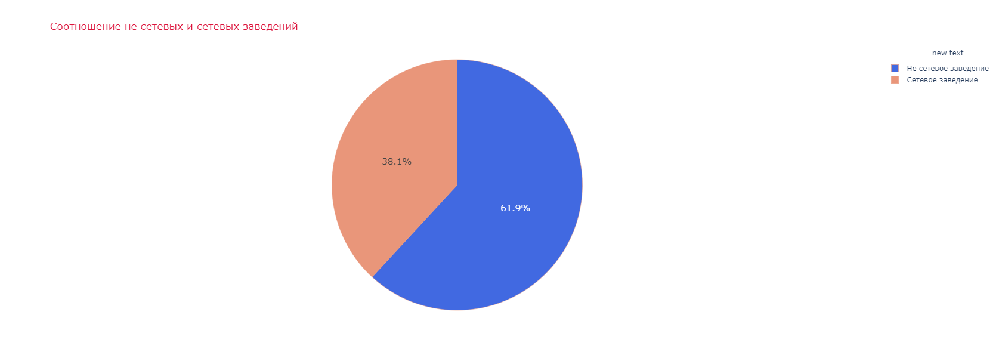

In [32]:
colors = ['#4169E1', '#E9967A']

name_rest = moscow_places_chain['chain']
values = moscow_places_chain['name']


fig = go.Figure(data=[go.Pie(labels=name_rest, values=values)])
fig.update_layout(title='Соотношение не сетевых и сетевых заведений',                  
                  title_font_color="#DC143C", # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,                                    
                                    showarrow=False)])
fig.update_traces(textfont_size=15,
                  marker=dict(colors=colors, line=dict(color='#E9967A', width=0.5)))
fig.show() 

### Категории сетевых и не сетевых заведений

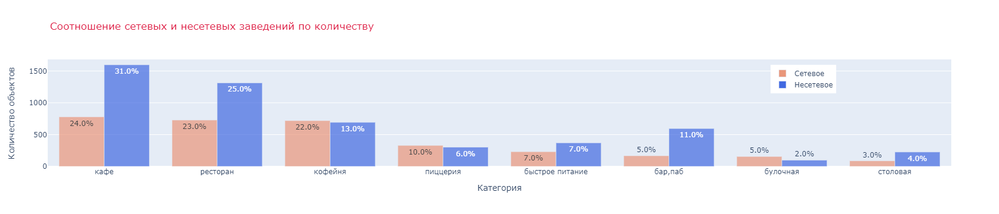

In [33]:
network = moscow_places.query('chain == 1').groupby(['category'])['name'].count()\
                                 .reset_index().sort_values(by='name', ascending=False)
network['ratio'] = ((network['name'] / network['name'].sum()) * 100).round(0).astype(str) + '%'

not_network = moscow_places.query('chain == 0').groupby(['category'])['name'].count()\
                                 .reset_index().sort_values(by='name', ascending=False)
not_network['ratio'] = ((not_network['name'] / not_network['name'].sum()) * 100).round(0).astype(str) + '%'

# инициализация фигуры
fig = go.Figure()
# добавление барчарта методом Bar()
fig.add_trace(go.Bar(x=network.category, y=network.name, text = network.ratio, \
                     name='Сетевое', marker={'color': '#E9967A', 'opacity': 0.7}))
fig.add_trace(go.Bar(x=not_network.category, y=not_network.name, text = not_network.ratio, \
                     name='Несетевое', marker={'color': '#4169E1', 'opacity': 0.7}))
# добавление соответствующих подписей и меток
fig.update_layout(title='Соотношение сетевых и несетевых заведений по количеству', title_font_color="#DC143C",
                  xaxis_title='Категория', yaxis_title='Количество объектов', legend=dict(y=0.95, x=0.80))
fig.update_traces(hoverinfo='all', hovertemplate='Количество объектов: %{y}')
# отображение фигуры
fig.show()

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- Несетевые заведения (5201) опережают сетевые (3205). Согласно графику, основные типы несетевых заведений — кафе и рестораны, в то время как в сетевых заведениях преобладают кофейни, пиццерии и булочные.
    
- Основные сетевые заведения: кафе, рестораны, кофейни и пиццерии - скорее всего это масштабные заведения с большим количеством франшиз

- Основные не сетевые заведения: кафе, рестораны, кофейни и бары, пабы, скорее всего это не большие заведения поэтому не сетевые заведения преобладают над сетевыми
</div>

## Топ-15 популярных заведений в Москве

In [34]:
moscow_places_name = moscow_places.query("chain == 1").pivot_table(index = 'name', values = ['address', 'rating', 'category'], 
                                                                   aggfunc = {'address':'count', 
                                                                              'rating':'median', 
                                                                              'category' : pd.Series.mode}) \
    .sort_values(by = 'address', ascending=False).head(15).reset_index()

In [35]:
moscow_places_name['ratio'] = ((moscow_places_name['address'] / moscow_places_name['address'].sum()) * 100) \
        .round(0).astype(str) + '%'

In [36]:
moscow_places_name.head(15)

,name,address,category,rating,ratio
0,шоколадница,120,кофейня,4.20,15.0%
1,домино'с пицца,76,пиццерия,4.20,9.0%
2,додо пицца,74,пиццерия,4.30,9.0%
3,one price coffee,71,кофейня,4.20,9.0%
4,яндекс лавка,69,ресторан,4.00,8.0%
5,cofix,65,кофейня,4.10,8.0%
6,prime,50,ресторан,4.20,6.0%
7,хинкальная,44,кафе,4.40,5.0%
8,кофепорт,42,кофейня,4.20,5.0%
9,кулинарная лавка братьев караваевых,39,кафе,4.40,5.0%


In [37]:
display(f"Средний рейтинг топ-15 составляет: {moscow_places_name['rating'].mean()}")

'Средний рейтинг топ-15 составляет: 4.21'

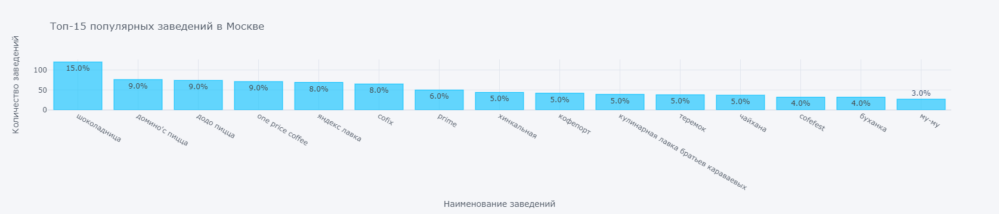

In [38]:
moscow_places_name.iplot(x = 'name', y ='address', text = 'ratio',
    kind="bar",                     
    yTitle="Количество заведений",
    xTitle="Наименование заведений", 
    color="#00BFFF",
    title="Топ-15 популярных заведений в Москве"
)

In [39]:
moscow_places_name_district = moscow_places.query("chain == 1").pivot_table(index = ['name', 'district'], values = ['address', 'rating', 'category'], 
                                                                   aggfunc = {'address':'count', 
                                                                              'rating':'median', 
                                                                              'category' : pd.Series.mode
                                                                             }) \
    .sort_values(by = 'address', ascending=False).head(15).reset_index()

In [40]:
moscow_places_name_district.head(15)

,name,district,address,category,rating
0,шоколадница,Центральный административный округ,38,кофейня,4.20
1,prime,Центральный административный округ,37,ресторан,4.20
2,кулинарная лавка братьев караваевых,Центральный административный округ,32,кафе,4.40
3,cofix,Центральный административный округ,20,кофейня,4.20
4,шоколадница,Западный административный округ,17,кофейня,4.20
5,му-му,Центральный административный округ,15,кафе,4.20
6,кофемания,Центральный административный округ,15,кофейня,4.40
7,one price coffee,Центральный административный округ,15,кофейня,4.20
8,кофепорт,Центральный административный округ,15,кофейня,4.30
9,шоколадница,Северный административный округ,14,кофейня,4.10


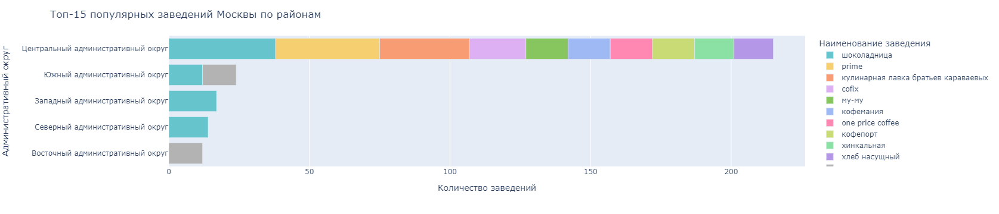

In [41]:
fig = px.bar(moscow_places_name_district,
             x='address',
             y='district',
             color='name', #По категории 
             color_discrete_sequence=px.colors.qualitative.Pastel
            )
fig.update_layout(legend_title='Наименование заведения',
                  title_font_color="#DC143C",
                  title = 'Топ-15 популярных заведений Москвы по районам',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Административный округ',
                  yaxis={'categoryorder': 'total ascending'} 
)
fig.show()

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- Основными популярными заведениями являются: `Шоколадница - 15%, ДоминосПицца - 9%, Додо Пицца - 9%`, замыкает список `Буханка - 4% и Му-Му - 3%`
- В основном это кофейни, пиццерии и рестораны
- Средний рейтинг топ-15 составляет: 4.21
- Данные заведения в основном не большие, но имеют достаточное количество франшиз, в основном сосредоточены в центральном административном округе
- Больше всего сосредоточены в центральном округе: `Шоколадница, One Price Cofee, Cofix`
</div>

## Административные районы Москвы

In [42]:
display(f"Общее количество заведений в Москве: {moscow_places['name'].nunique()}")

'Общее количество заведений в Москве: 5512'

In [43]:
moscow_places_count = moscow_places.pivot_table(index = 'district', values = 'address', 
                                                                   aggfunc = 'count') \
    .sort_values(by = 'address', ascending=False).reset_index()

In [44]:
moscow_places_count['ratio'] = ((moscow_places_count['address'] / moscow_places_count['address'].sum()) * 100) \
    .round(0).astype(str) + '%'

In [45]:
moscow_places_count

,district,address,ratio
0,Центральный административный округ,2242,27.0%
1,Северный административный округ,898,11.0%
2,Южный административный округ,892,11.0%
3,Северо-Восточный административный округ,890,11.0%
4,Западный административный округ,850,10.0%
5,Восточный административный округ,798,9.0%
6,Юго-Восточный административный округ,714,8.0%
7,Юго-Западный административный округ,709,8.0%
8,Северо-Западный административный округ,409,5.0%


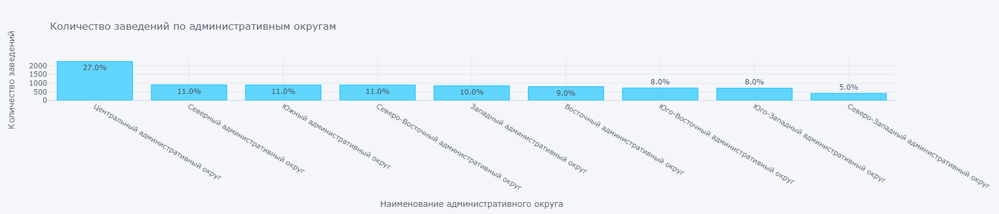

In [46]:
moscow_places_count.iplot(x = 'district', y = 'address', text = 'ratio', 
    kind="bar",
    yTitle="Количество заведений",
    xTitle="Наименование административного округа", 
    color="#00BFFF",
    title="Количество заведений по административным округам"
)

In [47]:
category_distinct = moscow_places.pivot_table(index = ['district', 'category'], values = 'address', 
                                                                   aggfunc = 'count') \
    .sort_values(by = 'address', ascending=False).reset_index()

category_distinct.head()

,district,category,address
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282


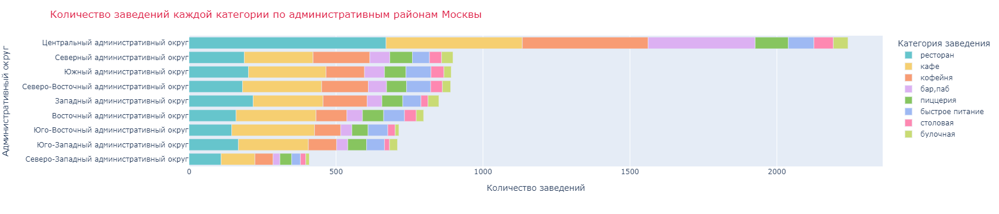

In [48]:
fig = px.bar(category_distinct,
             x='address',
             y='district',
             color='category', #По категории
             color_discrete_sequence=px.colors.qualitative.Pastel
            )
fig.update_layout(title = 'Количество заведений каждой категории по административным районам Москвы',
                  title_font_color="#DC143C",
                  legend_title='Категория заведения',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Административный округ',
                  yaxis={'categoryorder': 'total ascending'}
)
fig.show()

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- Больше всего заведений в `Центральном административном округе` - 2242, что составляет 27% от всех округов, `Северо-Западный административный округ` имеет меньше всего заведений - 409, всего 5% от общего числа.
- В центральном административном округе видно преимущество ресторанов и кафе, скорее всего это связано с высоким спросом и хорошей проходимости, так же в данном районе много туристов.
</div>

## Средние рейтинги по категориям заведений

In [49]:
moscow_places_rating = moscow_places.pivot_table(index = 'category', values = 'rating', 
                                                                   aggfunc = 'mean') \
    .sort_values(by = 'rating', ascending=False).round(2).reset_index()

In [50]:
moscow_places_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


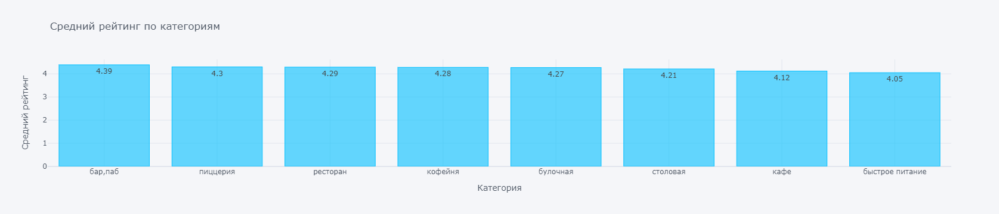

In [51]:
moscow_places_rating.iplot(x = 'category', y = 'rating', text = 'rating',
    kind="bar",
    yTitle="Средний рейтинг",
    xTitle="Категория", 
    color="#00BFFF",
    title="Средний рейтинг по категориям"
)

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- Самый высокий средний рейтинг у баров,пабов - 4.39, самый низкий, из усредненных у быстрого питания  - 4.05, различие между категориями не существенное
</div>

## Средний рейтинг на фоновой картограмме

In [52]:
moscow_places_district = moscow_places.pivot_table(index = 'district', values = 'rating', 
                                                                   aggfunc = 'mean') \
    .sort_values(by = 'rating', ascending=False).round(2).reset_index()
moscow_places_district

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [53]:
state_geo = "https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson"

In [54]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [55]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

In [56]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=moscow_places_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- У заведений Центрального административного округа самый высокий средний рейтинг — 4.38. У заведений Северо-Восточного и Юго-Восточного административных округов самые низкие средние рейтинги — 4.15 и 4.10. У заведений Северного административного округа - 4.24.
</div>

## Отображение всех заведений на карте с помощью `folium`

In [57]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

In [58]:
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
moscow_places.apply(create_clusters, axis=1)

# выводим карту
m

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- Большая часть заведений сосредоточена в центальном округе
</div>

## Топ-15 улиц по количеству заведений

In [59]:
moscow_places_address_top = moscow_places.pivot_table(index = 'street', values = 'address', aggfunc = 'count') \
    .sort_values(by = 'address', ascending = False).head(15).reset_index()
moscow_places_address_top

,street,address
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [60]:
moscow_places_address_street = moscow_places.pivot_table(index = ['street', 'category'], values = 'address', aggfunc = 'count') \
    .sort_values(by = 'address', ascending = False).reset_index()
moscow_places_address_street

,street,category,address
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
...,...,...,...
3816,молодёжная улица,кофейня,1
3817,монтажная улица,кофейня,1
3818,монтажная улица,ресторан,1
3819,москворецкая набережная,кофейня,1


In [61]:
# улицы из топ15
street_top15_category = moscow_places_address_street[moscow_places_address_street['street'].isin(moscow_places_address_top['street'])]
street_top15_category

,street,category,address
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
...,...,...,...
3442,проспект вернадского,булочная,1
3502,люблинская улица,пиццерия,1
3606,кутузовский проспект,булочная,1
3806,мкад,"бар,паб",1


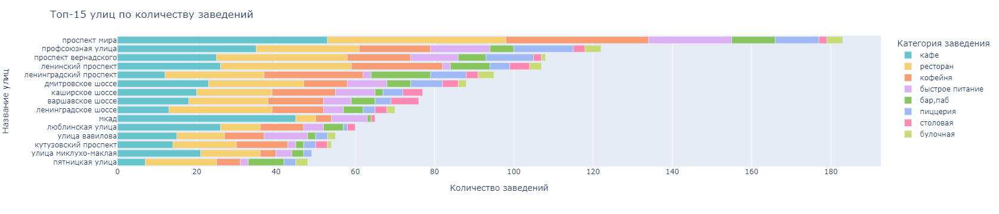

In [62]:
fig = px.bar(street_top15_category, 
             x='address', 
             y='street',                    
             color='category',
             color_discrete_sequence=px.colors.qualitative.Pastel
            )

fig.update_layout(title='Топ-15 улиц по количеству заведений',
                  legend_title='Категория заведения',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- Самое большое количество заведений из на улице `проспект Мира` - 184, в основном это кафе - 53 и рестораны - 45
- Замыкает топ-15 улиц по количеству завдений `улица Ваивилова` с количеством заведений - 48, большую часто которую составляют рестораны - 18, бары,пабы - 9 и кафе - 7 
</div>

## Улицы с одним объектом общепита

In [63]:
#Количество улиц с 1 объектом
moscow_places_address_object = moscow_places.pivot_table(index = 'street', values = 'address', aggfunc = 'count').reset_index()
moscow_places_address_object = moscow_places_address_object[moscow_places_address_object['address'] == 1]
print(f"Количество улиц с одним объектом общепита: {len(moscow_places_address_object)}")

Количество улиц с одним объектом общепита: 457


In [64]:
#Передача улицы в переменную
onlyone_street = moscow_places_address_object['street']
#Фильтрация по названию улицы
df_onlyone_street = moscow_places.query("street in @onlyone_street")

In [65]:
df_onlyone_street.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,средний счёт:500–800 ₽,650.0,NaN,1,NaN,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False


In [66]:
df_onlyone_street['category'].value_counts()

кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

In [67]:
df_onlyone_street['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             51
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

In [68]:
df_onlyone_street_district = df_onlyone_street.pivot_table(index = ['district', 'category'], values = 'address', aggfunc = 'count') \
    .sort_values(by = 'address', ascending = False).reset_index()
df_onlyone_street_district.head()

,district,category,address
0,Центральный административный округ,кафе,38
1,Центральный административный округ,ресторан,36
2,Центральный административный округ,кофейня,34
3,Центральный административный округ,"бар,паб",23
4,Южный административный округ,кафе,22


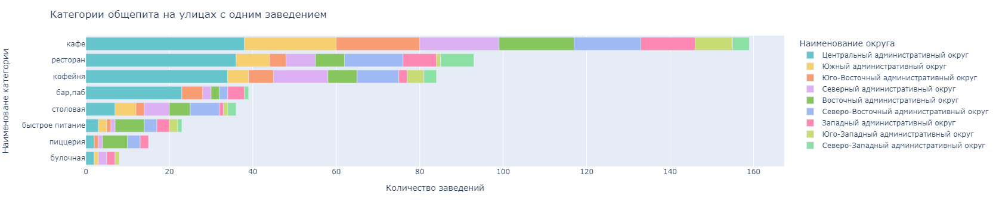

In [69]:
fig = px.bar(df_onlyone_street_district, 
             x='address', 
             y='category',                    
             color='district', 
             color_discrete_sequence=px.colors.qualitative.Pastel
            )

fig.update_layout(title='Категории общепита на улицах с одним заведением',
                  legend_title='Наименование округа',
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименоване категории',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- В основном на улицах с 1 заведением преобладают кафе - 160, меньше всего булочные - 8
- Чаще всего улицы с 1 общепитом встречаются в центральном административном округе - 38 улиц, самое малое количество Юго-Западный административный округе - 18
</div>

## Медиана среднего чека для каждого района

In [70]:
moscow_places_average_bill = moscow_places.pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc = 'median') \
    .sort_values(by = 'middle_avg_bill', ascending = False).reset_index()

In [71]:
moscow_places_average_bill.describe()

,middle_avg_bill
count,9.000000
mean,663.888889
std,205.818151
min,450.000000
25%,500.000000
50%,600.000000
75%,700.000000
max,1000.000000


In [72]:
# создаем карту Москвы

mm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=state_geo,
    data = moscow_places_average_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    fill_color='Blues',
    legend_name = 'Средний чек заведений по районам',
).add_to(mm)

mm

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- Самый большой средний чек в центральном и западном административном округе - 1000₽, как видно по картограмме по удалению средний чек снижается в 1.5-2 раза
- самый малый средний чек в Юго-Восточном административном округе - 450₽
- В среднем чек заведений составляет  - 600₽
</div>

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">   

**Вывод по разделу:** 

**1.** В данном датасете представлены следующие категории данных: 
- кафе - 2378 заведений
- ресторан - 2043 заведений
- кофейня - 1413 заведений
- бар,паб - 765 заведений
- пиццерия - 633 заведения
- быстрое питание - 603 заведения
- столовая - 315 заведений
- булочная - 256 заведений
- Как видно большое преимущество имеет кафе - 28% от всех заведений, далее идут рестораны - с 24%

**2.** Исследовано медианное количество посадочных мест:
- ресторан - 86 посадочных мест
- бар,паб - 82 посадочных места
- кофейня - 80 посадочных мест
- столовая - 76 посадочных мест
- быстрое питание - 65 посадочных мест
- кафе - 60 посадочных мест
- пиццерия - 55 посадочных мест
- булочная - 50 посадочных мест
- у ресторанов - 16% и баров - 15% наибольшее количество посадочных мест, самое наименьшее пиццерии - 10% и булочные - 9% от всего датасета

**3.** Несетевые заведения (5201) опережают сетевые (3205)
    
- Основные сетевые заведения: `кафе, рестораны, кофейни и пиццерии` - скорее всего это масштабные заведения с большим количеством франшиз

- Основные не сетевые заведения: `кафе, рестораны, кофейни и бары, пабы`, скорее всего это не большие заведения поэтому не сетевые заведения преобладают над сетевыми

**4.** Основными популярными заведениями являются: `Шоколадница - 15%, Домино'с Пицца - 9%, Додо Пицца - 9%`, замыкает список `Буханка - 4% и Му-Му - 3%`
- В основном это кофейни, пиццерии и рестораны
- Средний рейтинг топ-15 составляет: 4.21
- Данные заведения в основном не большие, но имеют достаточное количество франшиз, в основном сосредоточены в центральном административном округе
- Больше всего сосредоточены в центральном округе: `Шоколадница, One Price Cofee, Cofix`

**5.** Больше всего заведений в `Центральном административном округе` - 2242, что составляет 27% от всех округов, `Северо-Западный административный округ` имеет меньше всего заведений - 409, всего 5% от общего числа.
- В центральном административном округе видно преимущество `ресторанов` и `кафе`, скорее всего это связано с высоким спросом и хорошей проходимости, так же в данном районе много туристов.
  
**6.** У заведений Центрального административного округа самый высокий средний рейтинг — 4.38. У заведений Северо-Восточного и Юго-Восточного административных округов самые низкие средние рейтинги — 4.15 и 4.10. У заведений Северного административного округа - 4.24.


**7.** Самое большое количество заведений из на улице `проспект Мира` - 184, в основном это кафе - 53 и рестораны - 45
- Замыкает топ-15 улиц по количеству завдений `улица Ваивилова` с количеством заведений - 48, большую часто которую составляют рестораны - 18, `бары,пабы` - 9 и `кафе` - 7.
  
**8.**  В основном на улицах с 1 заведением преобладают `кафе` - 160, меньше всего булочные - 8
- Чаще всего улицы с 1 общепитом встречаются в центральном административном округе - 145 улицы, самое малое количество Юго-Западном административном округе - 18.

**9.**  Самый большой средний чек в центральном и западном административном округе - 1000₽, как видно по картограмме по удалению средний чек снижается в 1.5-2 раза
- самый малый средний чек в Юго-Восточном административном округе - 450₽
- В среднем чек заведений составляет  - 600₽.
</div>

# Детализация исследования кофейни

## Количество и расположение кофеен

In [73]:
#Фильтрация
moscow_places_coffee_shop = moscow_places.query("category == 'кофейня'")

In [74]:
moscow_places_coffee_shop.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False


In [75]:
#Сводная таблица по кофейням
moscow_places_coffee_shop_name = moscow_places_coffee_shop.pivot_table(index = 'district', 
                                                                       values = ['address', 'middle_avg_bill'], 
                                                                       aggfunc = {'address':'count', 'middle_avg_bill':'median'}) \
                                                                        .sort_values(by = 'address', ascending = False).reset_index()

In [105]:
moscow_places_coffee_shop_name['ratio'] = ((moscow_places_coffee_shop_name['address'] 
                                            / moscow_places_coffee_shop_name['address'].sum()) * 100) \
    .round(0).astype(str) + '%'

In [106]:
display(f"Всего кофеен в датасете: {(moscow_places_coffee_shop_name.address).sum()}")

'Всего кофеен в датасете: 1413'

In [78]:
moscow_places_coffee_shop_name.head(10)

,district,address,middle_avg_bill,ratio
0,Центральный административный округ,428,500.0,30.0%
1,Северный административный округ,193,325.0,14.0%
2,Северо-Восточный административный округ,159,325.0,11.0%
3,Западный административный округ,150,600.0,11.0%
4,Южный административный округ,131,387.5,9.0%
5,Восточный административный округ,105,400.0,7.0%
6,Юго-Западный административный округ,96,375.0,7.0%
7,Юго-Восточный административный округ,89,250.0,6.0%
8,Северо-Западный административный округ,62,325.0,4.0%


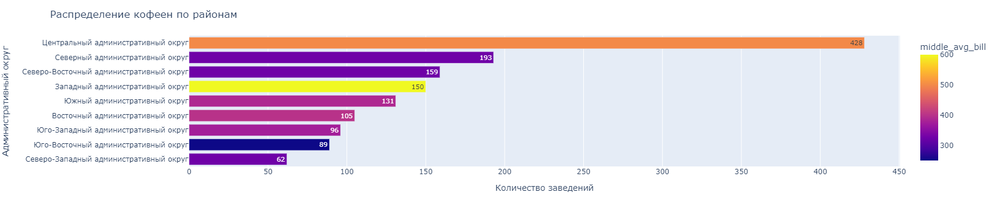

In [79]:
fig = px.bar(moscow_places_coffee_shop_name, 
             x='address', 
             y='district',                    
             text = 'address', 
             color = 'middle_avg_bill',
             color_discrete_sequence=px.colors.qualitative.Pastel
            )

fig.update_layout(title='Распределение кофеен по районам',
                  legend_title='Средний чек',
                   xaxis_title='Количество заведений',
                   yaxis_title='Административный округ',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

In [80]:
# создаем карту
mm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(mm)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_avg_bill']}"
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
moscow_places_coffee_shop.apply(create_clusters, axis=1)

# выводим карту
mm

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- Больше всего кофеен в центральном административном округе - 30% от всего датасета, средний чек там составляет - 500₽, северо-западный административный округ содержит самое малое количество заведений - 4%.
- Самый высокий средний чек имеет Западный административный округ  - 600₽, при то что данный район идет на 4 месте по количеству кофеен - 150.
</div>

## Круглосуточные кофейни

In [81]:
moscow_places_coffee_shop['is_24_7'] = moscow_places_coffee_shop['is_24_7'].replace(True, 'Круглосуточные')
moscow_places_coffee_shop['is_24_7'] = moscow_places_coffee_shop['is_24_7'].replace(False, 'Некруглосуточные')

In [82]:
moscow_places_coffee_shop['is_24_7'].unique()

array(['Некруглосуточные', 'Круглосуточные'], dtype=object)

In [83]:
moscow_places_coffee_shop.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,Некруглосуточные
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,Некруглосуточные
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,Некруглосуточные
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,Некруглосуточные
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,Некруглосуточные


In [84]:
moscow_places_coffee_shop_24_7 = moscow_places_coffee_shop.pivot_table(index = 'is_24_7', values = 'address', aggfunc = 'count') \
    .sort_values(by = 'address', ascending = False).reset_index()

In [85]:
moscow_places_coffee_shop_24_7

,is_24_7,address
0,Некруглосуточные,1354
1,Круглосуточные,59


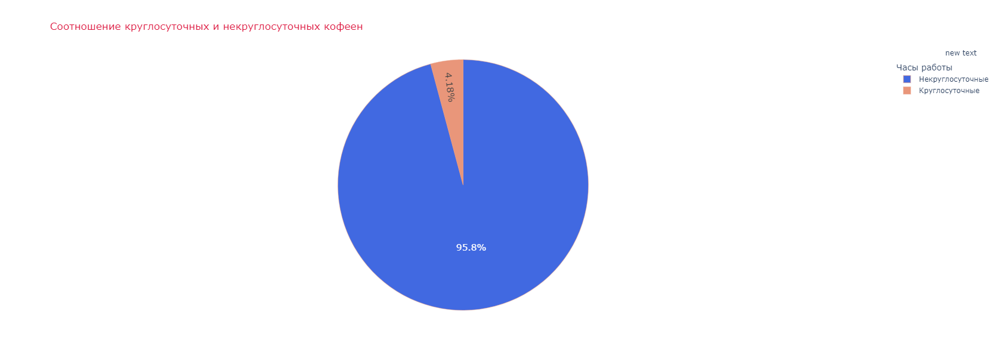

In [86]:
name_rest = moscow_places_coffee_shop_24_7['is_24_7']
values = moscow_places_coffee_shop_24_7['address']
fig = go.Figure(data=[go.Pie(labels=name_rest, values=values)])
fig.update_layout(title='Соотношение круглосуточных и некруглосуточных кофеен', 
                  legend_title='Часы работы',                  
                  title_font_color="#DC143C", # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,                                    
                                    showarrow=False)])
fig.update_traces(textfont_size=15,
                  marker=dict(colors=colors, line=dict(color='#E9967A', width=0.5)))
fig.show() 

In [87]:
#Фильтрация круглосуточных кофеен
moscow_places_coffee_shop_24 = moscow_places_coffee_shop[moscow_places_coffee_shop['is_24_7'] == 'Круглосуточные']

In [88]:
moscow_places_coffee_shop_24.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,дмитровское шоссе,Круглосуточные
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,ярославское шоссе,Круглосуточные
1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,ярославское шоссе,Круглосуточные
1214,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,мкад,Круглосуточные
1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица народного ополчения,Круглосуточные


In [89]:
# создаем карту
mmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(mmm)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['is_24_7']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
moscow_places_coffee_shop_24.apply(create_clusters, axis=1)

# выводим карту
mmm

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- Круглосуточных кофеен всего 4%
- Как видно в основном они расположены в центре города, данные кофейни  востребованы среди местных жителей, а так же туристов
</div>

## Рейтинги кофеен и распределение по райнам

In [90]:
moscow_places_coffee_shop.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,Некруглосуточные
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,Некруглосуточные
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,Некруглосуточные
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,Некруглосуточные
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,Некруглосуточные


In [91]:
moscow_places_coffee_shop_rating = moscow_places_coffee_shop.pivot_table(index = 'district', 
                                      values = ['rating', 'address'], 
                                      aggfunc = {'rating':'mean', 'address':'count'}) \
                                      .sort_values(by = 'rating', ascending = False) \
                                      .reset_index().round(2)

In [92]:
moscow_places_coffee_shop_rating.head(20)

,district,address,rating
0,Центральный административный округ,428,4.34
1,Северо-Западный административный округ,62,4.33
2,Северный административный округ,193,4.29
3,Юго-Западный административный округ,96,4.28
4,Восточный административный округ,105,4.28
5,Южный административный округ,131,4.23
6,Юго-Восточный административный округ,89,4.23
7,Северо-Восточный административный округ,159,4.22
8,Западный административный округ,150,4.20


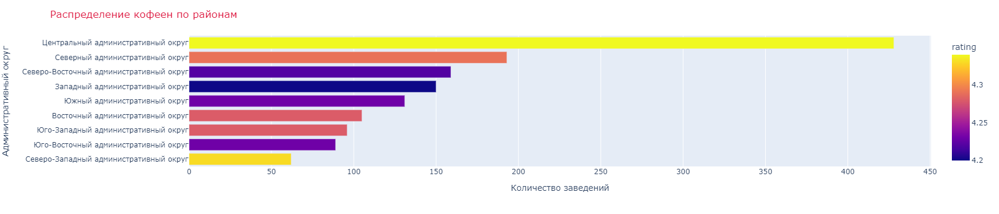

In [93]:
fig = px.bar(moscow_places_coffee_shop_rating, 
             x='address', 
             y='district',                                 
             color = 'rating',
             color_discrete_sequence=px.colors.qualitative.Pastel
            )

fig.update_layout(title='Распределение кофеен по районам',
                  title_font_color="#DC143C",
                  legend_title='Средний рейтинг',
                   xaxis_title='Количество заведений',
                   yaxis_title='Административный округ',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

In [94]:
#Фильтрация кофеен с рейтингом ниже 4
low_rating = moscow_places_coffee_shop.query("rating < 4").pivot_table(index = 'district', values = 'address', aggfunc = 'count').sort_values(by = 'address', ascending = False) \
                                      .reset_index()
low_rating['ratio'] = ((low_rating['address'] / low_rating['address'].sum()) * 100).round(0).astype(str) + '%'

#Фильтрация кофеен с рейтингом выше 4
good_rating = moscow_places_coffee_shop.query("rating >= 4").pivot_table(index = 'district', values = 'address', aggfunc = 'count').sort_values(by = 'address', ascending = False) \
                                      .reset_index()
good_rating['ratio'] = ((good_rating['address'] / good_rating['address'].sum()) * 100).round(0).astype(str) + '%'

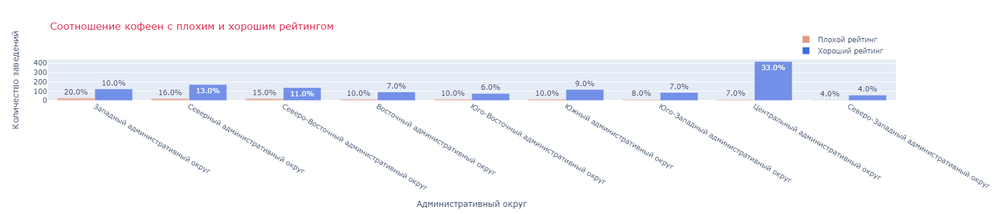

In [95]:
# инициализация фигуры
fig = go.Figure()
# добавление барчарта методом Bar()
fig.add_trace(go.Bar(x=low_rating.district, y=low_rating.address, text = low_rating.ratio, \
                     name='Плохой рейтинг', marker={'color': '#E9967A', 'opacity': 0.7}))
fig.add_trace(go.Bar(x=good_rating.district, y=good_rating.address, text = good_rating.ratio,\
                     name='Хороший рейтинг', marker={'color': '#4169E1', 'opacity': 0.7}))
# добавление соответствующих подписей и меток
fig.update_layout(title='Соотношение кофеен с плохим и хорошим рейтингом', title_font_color="#DC143C",
                  xaxis_title='Административный округ', yaxis_title='Количество заведений', legend=dict(y=1.70, x=0.88))
fig.update_traces(hoverinfo='all', hovertemplate='Количество объектов: %{y}')
# отображение фигуры
fig.show()

In [96]:
# создаем карту Москвы

mm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=state_geo,
    data = moscow_places_coffee_shop,
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    legend_name = 'Распределение кофеен по рейтингу',
).add_to(mm)

mm

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- `Центральный административный округ` лидирует по количеству кофеен с хорошим рейтингом - 418 заведений, средний рейтинг тут равен - 4.34
- По количеству рейтингов ниже 4 лидирует `Западный административный округ`, количество заведений тут - 27, средний рейтинг - 4.20, не мало важной особеностью этого может являться довольно высокий средний чек.
</div>

## Ориентир на стоимость чашки капучино при открытии кофейни

In [97]:
moscow_places_coffee_shop_price = moscow_places_coffee_shop.pivot_table(index = 'district', values = 'middle_coffee_cup', aggfunc = 'median') \
    .sort_values(by = 'middle_coffee_cup', ascending = False).reset_index()
moscow_places_coffee_shop_price['price'] = moscow_places_coffee_shop_price['middle_coffee_cup'].astype(str) + '₽'
moscow_places_coffee_shop_price

,district,middle_coffee_cup,price
0,Юго-Западный административный округ,198.0,198.0₽
1,Центральный административный округ,190.0,190.0₽
2,Западный административный округ,189.0,189.0₽
3,Северо-Западный административный округ,165.0,165.0₽
4,Северо-Восточный административный округ,162.5,162.5₽
5,Северный административный округ,159.0,159.0₽
6,Южный административный округ,150.0,150.0₽
7,Юго-Восточный административный округ,147.5,147.5₽
8,Восточный административный округ,135.0,135.0₽


In [98]:
moscow_places_coffee_shop_price.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
middle_coffee_cup,9.0,166.22,21.65,135.0,150.0,162.5,189.0,198.0


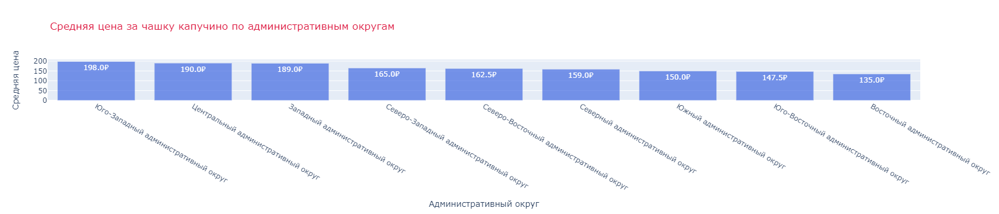

In [99]:
# инициализация фигуры
fig = go.Figure()
# добавление барчарта методом Bar()
fig.add_trace(go.Bar(x=moscow_places_coffee_shop_price.district, 
                     y=moscow_places_coffee_shop_price.middle_coffee_cup, 
                     text = moscow_places_coffee_shop_price.price, \
                     name='Плохой рейтинг', marker={'color': '#4169E1', 'opacity': 0.7}))

# добавление соответствующих подписей и меток
fig.update_layout(title='Средняя цена за чашку капучино по административным округам', title_font_color="#DC143C",
                  xaxis_title='Административный округ', yaxis_title='Средняя цена', legend=dict(y=1.70, x=0.88))
fig.update_traces(hoverinfo='all', hovertemplate='Количество объектов: %{y}')
# отображение фигуры
fig.show()

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- Самая дорогая чашка капучино стоит в Юго-Западном административном округе - 198₽, центральный административный округ идет на втором месте со стоимостью - 190₽,
- Самая низкая цена за чашку капучино в Восточном административном округе - 135₽
- В среднем цена варьируется, медиана стоимости одной чашки капучино по всем районам составляет 162.5₽, скорее всего на данную цену и стоит ориентироваться.
</div>

## Улицы по административным округам с наибольшим количеством кофеен

In [100]:
moscow_places_coffee_street = moscow_places_coffee_shop.pivot_table(index = ['district', 'street'], values = 'name', aggfunc = 'count') \
    .sort_values(by = 'name', ascending = False).reset_index()

In [101]:
moscow_places_coffee_street.head()

,district,street,name
0,Северный административный округ,ленинградский проспект,25
1,Северо-Восточный административный округ,проспект мира,19
2,Юго-Западный административный округ,ленинский проспект,18
3,Юго-Западный административный округ,профсоюзная улица,18
4,Центральный административный округ,проспект мира,17


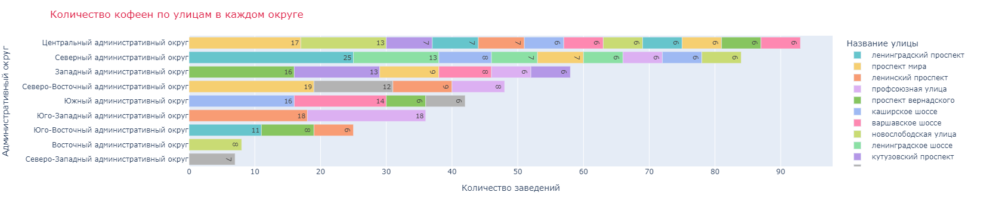

In [102]:
moscow_places_coffee_street = moscow_places_coffee_street.query('name > 5')
#Построение графика с фильтром более 5 кофеен на одной улице
fig = px.bar(moscow_places_coffee_street, 
             x='name', 
             y='district',                                 
             color = 'street', text = 'name', 
             color_discrete_sequence=px.colors.qualitative.Pastel
            )

fig.update_layout(title='Количество кофеен по улицам в каждом округе',
                  title_font_color="#DC143C", 
                  legend_title='Название улицы',
                   xaxis_title='Количество заведений',
                   yaxis_title='Административный округ',
                   yaxis={'categoryorder':'total ascending',}
                 )
fig.show()

In [103]:
#Фильтрация улиц с кофейнями менее 5
moscow_places_coffee_street1 = moscow_places_coffee_street['street']
moscow_places_coffee_shop_name_street = moscow_places_coffee_shop.query("street not in @moscow_places_coffee_street1")
moscow_places_coffee_shop_name_street.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,Некруглосуточные
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,Некруглосуточные
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,Некруглосуточные
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,Некруглосуточные
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,Некруглосуточные


### Улицы с не высоким количеством кофеен

In [104]:
## создаем карту
mmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(mmm)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['district']} {row['street']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
moscow_places_coffee_shop_name_street.apply(create_clusters, axis=1)

# выводим карту
mmm

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">  
    
- **Данный график демонстрирует на каких улицах не стоит открывать кофейню, так как их там избыточное количество и это будет не целесообразно, так же будет большая конкуренция, данная рекомендация может быть не точной, так как нет информации о трафике проходимости.**
- Центральный административный округ - `Проспект Мира - 17 и Новослободская улица - 13`
- Северный административный округ - `Ленинградский проспект - 25, Ленинградское шоссе - 13`
- Западный административный округ - `проспект Вернадского - 16 и Кутузовский проспект - 13`
- Северо-Восточный административный округ - `проспект Мира - 19 и Новодмитровская улица - 12`
- Южный административный округ - `Каширское шоссе - 16 и Варшавское шоссе - 14`
- Юго-Западный административный округ - `Профсоюзная улица - 18 и Ленинградский проспект`
- Юго-Восточный административный округ - `Люблинская улица - 11 и Волгоградский проспект`
- Восточный  административный округ - `Измайловское шоссе - 8`
- Северо-Западный административный округ - `Сходненская улица - 7`
  
</div>

<div style="color: #000000; border-left: 3px solid #DCDCDC; border-right: 3px solid #DCDCDC; margin-left: 20px; padding-left: 10px">   

**Вывод по разделу:** 

**1.** Всего кофеен в датасете - 1413
- Больше всего кофеен в центральном административном округе - 30% от всего датасета, средний чек там составляет - 500₽, северо-западный административный округ содержит самое малое количество заведений - 4%.
- Самый высокий средний чек имеет Западный административный округ  - 600₽, при то что данный район идет на 4 месте по количеству кофеен - 150.

**2.** Круглосуточных кофеен всего 4%, тогда как не круглосуточных - 96%
- Как видно в основном круглосуточные кофейни расположены в центре города, данные кофейни  востребованы среди местных жителей, а так же туристов


**3.** `Центральный административный округ` лидирует по количеству кофеен с хорошим рейтингом - 418 заведений, средний рейтинг тут равен - 4.34
- По количеству рейтингов ниже 4 лидирует `Западный административный округ`, количество заведений тут - 27, средний рейтинг - 4.20, не мало важной особеностью этого может являться довольно высокий средний чек.

**4.** Самая дорогая чашка капучино стоит в Юго-Западном административном округе - 198₽, центральный административный округ идет на втором месте со стоимостью - 190₽,
- Самая низкая цена за чашку капучино в Восточном административном округе - 135₽
- В среднем цена варьируется, медиана стоимости одной чашки капучино по всем районам составляет 162.5₽, скорее всего на данную цену и стоит ориентироваться.

**5.** Улицы с избыточным количеством кофеен, которые не стоит рассматривать при открытии кофейни:
- Центральный административный округ - `Проспект Мира - 17 и Новослободская улица - 13`
- Северный административный округ - `Ленинградский проспект - 25, Ленинградское шоссе - 13`
- Западный административный округ - `проспект Вернадского - 16 и Кутузовский проспект - 13`
- Северо-Восточный административный округ - `проспект Мира - 19 и Новодмитровская улица - 12`
- Южный административный округ - `Каширское шоссе - 16 и Варшавское шоссе - 14`
- Юго-Западный административный округ - `Профсоюзная улица - 18 и Ленинградский проспект`
- Юго-Восточный административный округ - `Люблинская улица - 11 и Волгоградский проспект`
- Восточный  административный округ - `Измайловское шоссе - 8`
- Северо-Западный административный округ - `Сходненская улица - 7`

**5.** **Для открытии кофейни стоит рассматривать центральный административный округ и Северный административный округ, не смотря на то, что там довольно высокий средний чек там достаточно большое количество кофеен с хорошим рейтингом, так же есть улицы на которых на которых будет не сильно большая конкуренция, возможно открыть круглосуточную кофейню, так как они востребованы в данных районах. Открывать заведение стоит в местах высокой прорходимости.**
</div>

# Шаг 5. Презентация для инвесторов

Презентация: <https://drive.google.com/file/d/1y3vBqTwJE948xFNxsvOTrktyPjsA76Ws/view?usp=drive_link> 

# Шаг 6. Общий вывод

**1.** Открыт DataFrame **`moscow_places`** - всего 14 столбцов и 8406 строк, явные дубликаты отсутствуют, не явные удалены, обнаружены пропуски в столбцах, так как их большое количество удалять их не стоит, так как будет искажение в данных: 
- `hours` - 536 - индивидуально для каждого заведения
- `price` - 5091 - для кажого административного округа может быть разным,
- `avg_bill` - 4590 - значения распределены между столбцами `middle_avg_bill` и `middle_coffee_cup`, решение оставить как есть,
- `middle_avg_bill` - 5257,
- `middle_coffee_cup` - 7871,
- `seats` - 3611 - - индивидуально для каждого заведения
- Всего - 5614 заведений
  
**2.** Созданы 2 столбца: `street` - с наименованиями улиц и `is_24_7` - с булевыми значениями, True - если заведение работает круглосуточно, пропуски оставлены.

**3.** Данный датасет имеет следующие категории данных:
- кафе - 2378 заведений
- ресторан - 2043 заведений
- кофейня - 1413 заведений
- бар,паб - 765 заведений
- пиццерия - 633 заведения
- быстрое питание - 603 заведения
- столовая - 315 заведений
- булочная - 256 заведений
- Как видно большое преимущество имеет кафе - 28% от всех заведений, далее идут рестораны - с 24%

**4.**  Исследовано медианное количество посадочных мест:
- ресторан - 86 посадочных мест
- бар,паб - 82 посадочных места
- кофейня - 80 посадочных мест
- столовая - 76 посадочных мест
- быстрое питание - 65 посадочных мест
- кафе - 60 посадочных мест
- пиццерия - 55 посадочных мест
- булочная - 50 посадочных мест
- у ресторанов - 16% и баров - 15% наибольшее количество посадочных мест, самое наименьшее пиццерии - 10% и булочные - 9% от всего датасета

**5.** Несетевые заведения (5201) опережают сетевые (3205)
    
- Основные сетевые заведения: `кафе, рестораны, кофейни и пиццерии` - скорее всего это масштабные заведения с большим количеством франшиз

- Основные не сетевые заведения: `кафе, рестораны, кофейни и бары, пабы`, скорее всего это не большие заведения поэтому не сетевые заведения преобладают над сетевыми

**6.** Основными популярными заведениями являются: `Шоколадница - 15%, Домино'с Пицца - 9%, Додо Пицца - 9%`, замыкает список `Буханка - 4% и Му-Му - 3%`
- В основном это кофейни, пиццерии и рестораны
- Средний рейтинг топ-15 составляет: 4.21
- Данные заведения в основном не большие, но имеют достаточное количество франшиз, в основном сосредоточены в центральном административном округе
- Больше всего сосредоточены в центральном округе: `Шоколадница, One Price Cofee, Cofix` 

**7.** Больше всего заведений в `Центральном административном округе` - 2242, что составляет 27% от всех округов, `Северо-Западный административный округ` имеет меньше всего заведений - 409, всего 5% от общего числа.
- В центральном административном округе видно преимущество `ресторанов` и `кафе`, скорее всего это связано с высоким спросом и хорошей проходимости, так же в данном районе много туристов.

**8.** У заведений Центрального административного округа самый высокий средний рейтинг — 4.38. У заведений Северо-Восточного и Юго-Восточного административных округов самые низкие средние рейтинги — 4.15 и 4.10. У заведений Северного административного округа - 4.24.   
 
**9.** Самое большое количество заведений из на улице `проспект Мира` - 184, в основном это кафе - 53 и рестораны - 45
- Замыкает топ-15 улиц по количеству завдений `улица Ваивилова` с количеством заведений - 48, большую часто которую составляют рестораны - 18, `бары,пабы` - 9 и `кафе` - 7. 

**10.** В основном на улицах с 1 заведением преобладают `кафе` - 160, меньше всего булочные - 8
- Чаще всего улицы с 1 общепитом встречаются в центральном административном округе - 145 улицы, самое малое количество Юго-Западном административном округе - 18. 

**11.** Самый большой средний чек в центральном и западном административном округе - 1000₽, как видно по картограмме по удалению средний чек снижается в 1.5-2 раза
- самый малый средний чек в Юго-Восточном административном округе - 450₽
- В среднем чек заведений составляет  - 600₽.

**12.**  Всего кофеен в датасете - 1413
- Больше всего кофеен в центральном административном округе - 30% от всего датасета, средний чек там составляет - 500₽, северо-западный административный округ содержит самое малое количество заведений - 4%.
- Самый высокий средний чек имеет Западный административный округ  - 600₽, при то что данный район идет на 4 месте по количеству кофеен - 150.

**13.** Круглосуточных кофеен всего 4%, тогда как не круглосуточных - 96%
- Как видно в основном круглосуточные кофейни расположены в центре города, данные кофейни  востребованы среди местных жителей, а так же туристов


**14.** `Центральный административный округ` лидирует по количеству кофеен с хорошим рейтингом - 418 заведений, средний рейтинг тут равен - 4.34
- По количеству рейтингов ниже 4 лидирует `Западный административный округ`, количество заведений тут - 27, средний рейтинг - 4.20, не мало важной особеностью этого может являться довольно высокий средний чек.

**15.** Самая дорогая чашка капучино стоит в Юго-Западном административном округе - 198₽, центральный административный округ идет на втором месте со стоимостью - 190₽,
- Самая низкая цена за чашку капучино в Восточном административном округе - 135₽
- В среднем цена варьируется, медиана стоимости одной чашки капучино по всем районам составляет 162.5₽, скорее всего на данную цену и стоит ориентироваться.

**16.** Улицы с избыточным количеством кофеен, которые **не стоит** рассматривать при открытии кофейни:
- Центральный административный округ - `Проспект Мира - 17 и Новослободская улица - 13`
- Северный административный округ - `Ленинградский проспект - 25, Ленинградское шоссе - 13`
- Западный административный округ - `проспект Вернадского - 16 и Кутузовский проспект - 13`
- Северо-Восточный административный округ - `проспект Мира - 19 и Новодмитровская улица - 12`
- Южный административный округ - `Каширское шоссе - 16 и Варшавское шоссе - 14`
- Юго-Западный административный округ - `Профсоюзная улица - 18 и Ленинградский проспект`
- Юго-Восточный административный округ - `Люблинская улица - 11 и Волгоградский проспект`
- Восточный  административный округ - `Измайловское шоссе - 8`
- Северо-Западный административный округ - `Сходненская улица - 7`

**17.** **Для открытии кофейни стоит рассматривать центральный административный округ и Северный административный округ, не смотря на то, что там довольно высокий средний чек там достаточно большое количество кофеен с хорошим рейтингом, так же есть улицы на которых на которых будет не сильно большая конкуренция, возможно открыть круглосуточную кофейню, так как они востребованы в данных районах. Открывать заведение стоит в местах высокой прорходимости.**  